# Openness Closeness Computation Notebook

### Practical workflow in GA-SaMMT

1. **Compute** Negative Openness (NO) or Positive Openness (PO) from bathymetric grid.
2. **Threshold** the raster using `mean - c × std` to create a binary mask of candidate cells.
3. **Vectorize** the mask into polygons.
4. **Filter** by minimum area threshold (remove noise).
5. **Add attributes** (shape, topographic, profile).
6. **Classify** each polygon into a morphological type (mound, ridge, pockmark, etc.).

### Openness vs. TPI: when to use which?

- Use **TPI** when working with large datasets and speed matters, or when features are broadly defined by local relief.
- Use **Openness** when features have a strong angular geometry (circular pits, conical mounds), or when the terrain has complex asymmetric shapes.
- **Combine both** for maximum robustness — the GA-SaMMT `TPI LMI` tool also combines TPI with Local Moran's I for an additional spatial autocorrelation filter.

# GA-SaMMT Topographic Openness Pipeline: Steps 1 to 12

This section outlines the complete structural progression of the **GA-SaMMT Geomorphic Mapping Algorithm**. The pipeline is organized into four distinct execution phases that systematically transform raw digital elevation grids into validated, presentation-grade vector landform polygons.

---

```mermaid
flowchart TB

%% =========================
%% PHASE I
%% =========================
subgraph P1["PHASE I: DATA INGESTION"]
direction TB
A1["Step 1: Ingest Raster"]
A2["Step 2: Ray Casting"]
A1 --> A2
end

%% =========================
%% PHASE II
%% =========================
subgraph P2["PHASE II: SEEDING AND STATISTICAL ZONING"]
direction TB
B1["Step 3: Track Seeds"]
B2["Step 4: Compute Statistics"]
B3["Step 5: Thresholding"]

B1 --> B2 --> B3
end

%% =========================
%% PHASE III
%% =========================
subgraph P3["PHASE III: EXTRACTION AND VECTORIZATION"]
direction TB
C1["Step 6: Binary Masks"]
C2["Step 7: Hierarchy Check"]
C3["Step 8: Polygonization"]
C4["Step 9: Seed Pruning"]

C1 --> C2 --> C3 --> C4
end

%% =========================
%% PHASE IV
%% =========================
subgraph P4["PHASE IV: OVERLAY LOGIC AND REFINEMENT"]
direction TB
D1["Step 10: Scale Blending"]
D2["Step 11: Geometry Clean"]
D3["Step 12: Final Outputs"]

D1 --> D2 --> D3
end

%% =========================
%% PHASE CONNECTIONS
%% =========================
A2 --> B1
B3 --> C1
C4 --> D1
```

## Processing Phase Summaries

* **Phase I (Steps 1–2):** Takes raw marine bathymetry arrays, aligns the vertical orientation convention, and computes regional exposure metrics using long-range ray casting equations.
* **Phase II (Steps 3–5):** Isolates key feature anchors (peaks or pits) and evaluates global standard deviation offsets to automatically establish the boundary thresholds for structural shapes.
* **Phase III (Steps 6–9):** Converts continuous raster grids into independent boolean masks, runs vector-tracing loops to produce geospatial polygons, and throws out background noise that lacks a core landform seed.
* **Phase IV (Steps 10–12):** Blends strict and loose boundaries to correctly segment complex landforms, runs automated geometric cleanup code, and binds the final outputs to active memory for high-contrast mapping.

Imports

In [1]:
import os
import time
import warnings
from pathlib import Path
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.ticker as mticker
import rasterio
from rasterio.enums import Resampling
from rasterio import features
from scipy.ndimage import maximum_filter, minimum_filter
from shapely.geometry import shape, MultiPolygon
from shapely.ops import unary_union

## Gifford Bathymetric TIF

## Set the File Path

In [2]:
TARGET_BATHY_PATH = "../data/gifford_bathy.tif"

We start by setting out the [radius cells](#circle-radius) for Gifford Seamounts (Gifford).

In [3]:
RADIUS_CELLS = 10         # Tightened lookup horizon to capture local channels (use 5 for finer details)
C_LARGE = -0.15            # Large scale multiplier parameter
C_SMALL = 0.0              # Small scale multiplier parameter
AREA_THRESHOLD = 750.0     # Adjusted minimum feature footprint filter (midpoint between 500 and 1000)

### STEP 1: LOAD RASTER & INITIALIZE SPATIAL METADATA

In [4]:
with rasterio.open(TARGET_BATHY_PATH) as src:
    B_raw = src.read(1)
    tif_profile = src.meta.copy()
    cell_size = src.transform[0]
    nodata_val = src.nodatavals[0]    
    Z_grid = np.where(B_raw == nodata_val, np.nan, B_raw.astype(float)) if nodata_val is not None else B_raw.astype(float)

### Enforce standard elevation-positive-up convention

In [5]:
Z_grid = -Z_grid  
compass_definitions = {
    "N":  (-1,  0), "NE": (-1,  1), "E":  ( 0,  1), "SE": ( 1,  1),
    "S":  ( 1,  0), "SW": ( 1, -1), "W":  ( 0, -1), "NW": (-1, -1)
}

Geometry Meta is the outline or skeleton of the compass directions into definitions.

In [6]:
geometry_meta = {}
for direction, (dr, dc) in compass_definitions.items():
    steps = np.arange(1, RADIUS_CELLS + 1)
    row_offsets = dr * steps
    col_offsets = dc * steps
    step_multiplier = np.sqrt(dr**2 + dc**2)
    distances = steps * cell_size * step_multiplier
    geometry_meta[direction] = {
        "row_offsets": row_offsets, "col_offsets": col_offsets, "distances": distances
    }

### STEP 2: DUAL-CHANNEL VECTORIZED RAY CASTING ENGINE (0-180 SCALE)

Calculating Positive Openness (PO) and Negative Openness (NO) matrices concurrently across 8 cardinal directions (North, Northeast, East, Southeast, South, Southwest, West and Northwest).

In [7]:
global_start_time = time.time()
rows, cols = Z_grid.shape
max_gamma_all_dirs, min_gamma_all_dirs = [], []

for direction, geom in geometry_meta.items():
    gamma_steps = np.full((RADIUS_CELLS, rows, cols), np.nan)
    for step_idx in range(RADIUS_CELLS):
        dr, dc, dist = geom["row_offsets"][step_idx], geom["col_offsets"][step_idx], geom["distances"][step_idx]
        Z_shifted = np.roll(Z_grid, shift=(-dr, -dc), axis=(0, 1))
        
        # Boundary Edge Buffer Isolation
        boundary_mask = np.ones((rows, cols), dtype=bool)
        if dr > 0: boundary_mask[:dr, :] = False
        if dr < 0: boundary_mask[dr:, :] = False
        if dc > 0: boundary_mask[:, :dc] = False
        if dc < 0: boundary_mask[:, dc:] = False
        Z_shifted[~boundary_mask] = np.nan
        gamma_steps[step_idx] = np.arctan((Z_shifted - Z_grid) / dist)
        
    with np.errstate(all='ignore'):
        with warnings.catch_warnings():
            warnings.simplefilter("ignore", category=RuntimeWarning)
            max_gamma_dir = np.nanmax(gamma_steps, axis=0)
            min_gamma_dir = np.nanmin(gamma_steps, axis=0)
    max_gamma_dir[np.isnan(max_gamma_dir)] = 0.0
    min_gamma_dir[np.isnan(min_gamma_dir)] = 0.0
    max_gamma_all_dirs.append(max_gamma_dir)
    min_gamma_all_dirs.append(min_gamma_dir)

mean_max_gamma = np.mean(np.stack(max_gamma_all_dirs, axis=0), axis=0)
mean_min_gamma = np.mean(np.stack(min_gamma_all_dirs, axis=0), axis=0)

Visualize the result

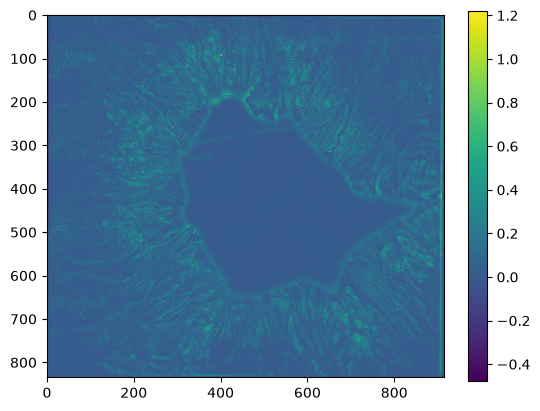

In [8]:
plt.imshow(mean_max_gamma)
plt.colorbar()

This figure shows the average maximum slope (or angle of view/terrain inclination) across all analyzed geographic directions. The cell is likely at the bottom of a steep depression, valley, or pit, because looking out in almost all directions yields a high maximum upward slope (the horizon is highly obstructed).

#### Next, let us implement traditional Yokoyama 0° to 180° mathematical conversion bounds

This step converts raw angular slopes into standard Topographic Openness indexes (0° to 180°).

In [9]:
PO_grid = np.degrees((np.pi / 2.0) - mean_max_gamma)
NO_grid = np.degrees((np.pi / 2.0) + mean_min_gamma)
nan_mask = np.isnan(Z_grid)
PO_grid[nan_mask], NO_grid[nan_mask] = np.nan, np.nan

### PIPELINE ENCAPSULATION ROUTINE: STEPS 3 TO 12

In [10]:
def run_sa_mmt_segmentation(O_channel, target_mode):
    footprint = np.ones((5, 5), dtype=bool)    
    
    # Step 3: Select target channel and local extrema type
    if target_mode == "high":
        local_max = maximum_filter(Z_grid, footprint=footprint, mode='constant', cval=np.nan)
        extrema = (Z_grid == local_max) & ~np.isnan(Z_grid)
    else:
        local_min = minimum_filter(Z_grid, footprint=footprint, mode='constant', cval=np.nan)
        extrema = (Z_grid == local_min) & ~np.isnan(Z_grid)
        
    # Steps 4 & 5: Calculate openness statistics and dual thresholds
    O_valid = O_channel[np.isfinite(O_channel)]
    mu = float(np.mean(O_valid))
    sigma = float(np.std(O_valid))
    T_large = mu - (C_LARGE * sigma)
    T_small = mu - (C_SMALL * sigma)

    # Step 6: Create two binary masks
    M_large = (O_channel < T_large) & ~np.isnan(O_channel)
    M_small = (O_channel < T_small) & ~np.isnan(O_channel)

    # Step 7: Determine strict and loose masks
    if np.sum(M_large) <= np.sum(M_small):
        M_strict, M_loose = M_large, M_small
    else:
        M_strict, M_loose = M_small, M_large

    # Step 8: Polygonise both masks
    def polygonise(mask):
        polygons = []
        for geojson_shape, _ in features.shapes(mask.astype(np.uint8), mask=mask, transform=tif_profile['transform']):
            geom = shape(geojson_shape)
            if not geom.is_valid: geom = geom.buffer(0)
            polygons.append(geom)
        return polygons
    P_strict_raw = polygonise(M_strict)
    P_loose_raw = polygonise(M_loose)

    # Step 9: Keep only polygons containing local extrema
    extrema_rows, extrema_cols = np.where(extrema)
    extrema_points = [shape({'type': 'Point', 'coordinates': tif_profile['transform'] * (col + 0.5, row + 0.5)}) 
                      for row, col in zip(extrema_rows, extrema_cols)]
    if not extrema_points: return [], O_channel
    extrema_collection = unary_union(extrema_points)
    P_strict = [P for P in P_strict_raw if P.intersects(extrema_collection)]
    P_loose = [Q for Q in P_loose_raw if Q.intersects(extrema_collection)]
    
    # Step 10: Overlay split/merge logic
    P_raw = []
    for Q in P_loose:
        contained = []
        for P in P_strict:
            if Q.contains(P): contained.append(P)
            elif Q.intersects(P):
                if Q.intersection(P).area / P.area > 0.5: contained.append(P)
        if len(contained) > 1: P_raw.extend(contained)
        elif len(contained) == 1: P_raw.append(Q)
            
    # Step 11: Clean geometries and remove small features
    P_cleaned = [P.buffer(0) if not P.is_valid else P for P in P_raw]
    P_unique = []
    for geom in P_cleaned:
        if not any(geom.equals(u) for u in P_unique): P_unique.append(geom)
    P_final = [P for P in P_unique if P.area >= AREA_THRESHOLD]\
    
    # Step 12: Return outputs
    return P_final, O_channel

### Print Pipeline Outputs

In [11]:
print("Processing Steps 3-12 for Bathymetric High Features (NO Channel)...")
high_features, NO_out = run_sa_mmt_segmentation(NO_grid, target_mode="high")
print("Processing Steps 3-12 for Bathymetric Low Features (PO Channel)...")
low_features, PO_out = run_sa_mmt_segmentation(PO_grid, target_mode="low")
print("\n" + "="*60)
print("GA-SAMMT STRUCTURAL WORKFLOW SEGMENTATION COMPLETE")
print("="*60)
print(f"Total Computation Runtime:              {time.time() - global_start_time:.2f}s")
print(f"Final Mapped High Features (Plateau):   {len(high_features)} Polygons")
print(f"Final Mapped Low Features (Canyons):    {len(low_features)} Polygons")
print("="*60)

Processing Steps 3-12 for Bathymetric High Features (NO Channel)...
Processing Steps 3-12 for Bathymetric Low Features (PO Channel)...

GA-SAMMT STRUCTURAL WORKFLOW SEGMENTATION COMPLETE
Total Computation Runtime:              102.65s
Final Mapped High Features (Plateau):   1231 Polygons
Final Mapped Low Features (Canyons):    1154 Polygons


### Create a visual to compare the PO vs NO polygons in a plot

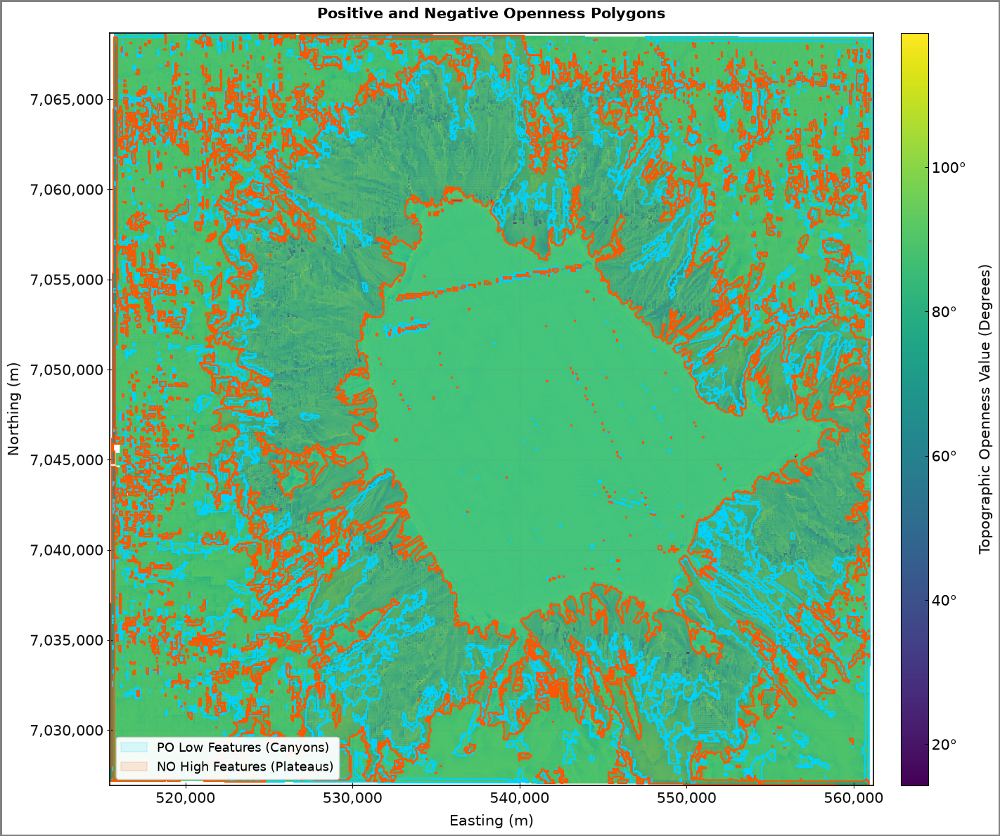

In [12]:
fig, ax = plt.subplots(figsize=(15, 12), edgecolor='gray', linewidth=2.5)
transform = tif_profile['transform']
x_min, y_max = transform * (0, 0)
x_max, y_min = transform * (cols, rows)
spatial_extent = [x_min, x_max, y_min, y_max]
im_viridis = ax.imshow(NO_out, cmap='viridis', extent=spatial_extent, aspect='auto')
po_color = '#00d2ff'  # Electric Cyan for PO Low Features
no_color = '#ff5500'  # Safety Orange for NO High Features

for poly in low_features:
    geoms = poly.geoms if isinstance(poly, MultiPolygon) else [poly]
    for geom in geoms:
        x, y = geom.exterior.xy
        ax.plot(x, y, color=po_color, linewidth=1.5, alpha=1.0, label='_nolegend_')
        ax.fill(x, y, color=po_color, alpha=0.12, label='_nolegend_')
for poly in high_features:
    geoms = poly.geoms if isinstance(poly, MultiPolygon) else [poly]
    for geom in geoms:
        x, y = geom.exterior.xy
        ax.plot(x, y, color=no_color, linewidth=1.5, alpha=1.0, label='_nolegend_')
        ax.fill(x, y, color=no_color, alpha=0.12, label='_nolegend_')
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)
ax.get_xaxis().set_major_formatter(mticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax.get_yaxis().set_major_formatter(mticker.FuncFormatter(lambda y, p: format(int(y), ',')))
ax.set_xlabel("Easting (m)", fontsize=15, labelpad=8, color="#111111")
ax.set_ylabel("Northing (m)", fontsize=15, labelpad=8, color="#111111")
ax.tick_params(colors="#111111", labelsize=15, direction='inout', length=6)
ax.grid(True, linestyle="-", alpha=0.15, color="gray", zorder=0)
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.2)
po_patch = mpatches.Patch(facecolor=po_color, alpha=0.12, edgecolor=po_color, linewidth=1.5, label='PO Low Features (Canyons)')
no_patch = mpatches.Patch(facecolor=no_color, alpha=0.12, edgecolor=no_color, linewidth=1.5, label='NO High Features (Plateaus)')
ax.legend(handles=[po_patch, no_patch], loc='lower left', framealpha=0.95, edgecolor='lightgray', fontsize=13)
cbar = fig.colorbar(im_viridis, ax=ax, orientation="vertical", pad=0.03, shrink=1.0, aspect=28)
cbar.set_label("Topographic Openness Value (Degrees)", fontsize=15, labelpad=12, color="#111111")
cbar.ax.tick_params(labelsize=15, direction='in')

def degree_formatter(x, pos):
    return f"{x:.0f}°"
cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(degree_formatter))
plt.title("Positive and Negative Openness Polygons", fontsize=15, pad=15, weight="bold")
plt.tight_layout()
plt.savefig("../data/gifford_openness_polygons_map.png", bbox_inches='tight', dpi=300)
plt.show()

### Save the output as a geopackage file raster and vector

In [13]:
# Explicitly defining your local projected coordinate reference system
raster_crs = 'EPSG:32757'  # UTM Zone 57S

# --- A. Export Vectors to GeoPackage (.gpkg) ---
gpkg_output_path = "../data/gifford_openness_analysis.gpkg"

# Convert list of Shapely geometries directly to structured GeoDataFrames using your CRS
gdf_low = gpd.GeoDataFrame(geometry=low_features, crs=raster_crs)
gdf_high = gpd.GeoDataFrame(geometry=high_features, crs=raster_crs)

# Save vector sets as separate named feature layers inside one GeoPackage database
gdf_low.to_file(gpkg_output_path, layer="PO_Low_Features_Canyons", driver="GPKG")
gdf_high.to_file(gpkg_output_path, layer="NO_High_Features_Plateaus", driver="GPKG")
print(f"-> Successfully saved GIS Vector Layers to: {gpkg_output_path}")

# --- B. Export Real Data Raster to GeoTIFF (.tif) ---
raster_output_path = "../data/gifford_negative_openness_raster.tif"

# Clone and override structural parameters, strictly overwriting the CRS
raster_profile = tif_profile.copy()
raster_profile.update({
    'driver': 'GTiff',
    'height': NO_out.shape[0],
    'width': NO_out.shape[1],
    'dtype': str(NO_out.dtype),
    'count': 1,
    'crs': raster_crs  # Hardcodes the projection directly into the GeoTIFF headers
})

# Commit the 2D floating-point grid matrix to geographical disk file
with rasterio.open(raster_output_path, "w", **raster_profile) as dst:
    dst.write(NO_out, 1)
print(f"-> Successfully saved GIS Raster Core to: {raster_output_path}")
print("All exports completed safely.")

-> Successfully saved GIS Vector Layers to: ../data/gifford_openness_analysis.gpkg
-> Successfully saved GIS Raster Core to: ../data/gifford_negative_openness_raster.tif
All exports completed safely.


### Visualize the geopackage output in a map view

In [14]:
# 1. Load the layer paths from your GeoPackage
gpkg_path = "../data/gifford_openness_analysis.gpkg"

gdf_canyons = gpd.read_file(gpkg_path, layer="PO_Low_Features_Canyons")
gdf_plateaus = gpd.read_file(gpkg_path, layer="NO_High_Features_Plateaus")

# 2. Plot the first layer interactively
# We use color mapping and a baseline background map (like OpenStreetMap)
m = gdf_canyons.explore(color="#00d2ff", name="Canyons (PO Low)", tiles="CartoDB positron")

# 3. Layer the second dataset on top of the same map canvas
gdf_plateaus.explore(m=m, color="#ff5500", name="Plateaus (NO High)")

# Display the map view frame
m

## OS Bathymetric TIF

#### Set the File Path

In [15]:
TARGET_BATHY_PATH = "../data/os_bathy.tif"

We start by setting out the [radius cells](#circle-radius) for Oceanic Shoals (OS).

In [16]:
RADIUS_CELLS = 10         # Lookup horizon matrix index (tight sweep for local bank edges)
C_LARGE = -0.15           # Coarse scale offset parameter (tunes broad platform perimeters)
C_SMALL = 0.0             # Fine scale baseline constraint (anchors ridge/canyon spines)

# Explicitly define minimum feature footprint size in actual PIXELS to prevent noise
TARGET_MIN_PIXELS = 45    # Filters out any polygon spanning less than 45 total raster cells

# PERFORMANCE TUNING: Downsampling factor (1 = raw data, 2 = half resolution, 4 = quarter resolution)
# Scales down data processing loops quadratically to bypass memory bottlenecks.
DOWNSAMPLE_FACTOR = 4

### STEP 1: LOAD RASTER & INITIALIZE SPATIAL METADATA

In [17]:
with rasterio.open(str(TARGET_BATHY_PATH)) as src:
    tif_profile = src.meta.copy()
    
    if DOWNSAMPLE_FACTOR > 1:
        # Calculate downsampled grid dimensions
        new_height = int(src.height / DOWNSAMPLE_FACTOR)
        new_width = int(src.width / DOWNSAMPLE_FACTOR)
        print(f"-> Performance Mode: Downsampling raster from ({src.height}x{src.width}) to ({new_height}x{new_width})")
        
        # Read and resample the data using bilinear interpolation
        B_raw = src.read(
            1,
            out_shape=(new_height, new_width),
            resampling=Resampling.bilinear
        )
        
        # Update transform and profile parameters to match the new grid spacing
        new_transform = src.transform * src.transform.scale(
            (src.width / B_raw.shape[1]),
            (src.height / B_raw.shape[0])
        )
        tif_profile.update({
            'height': new_height,
            'width': new_width,
            'transform': new_transform
        })
    else:
        B_raw = src.read(1)
        
    cell_size = tif_profile['transform'][0]
    nodata_val = src.nodatavals[0]
    
    # Isolate valid cells from source raster boundaries
    Z_grid = np.where(B_raw == nodata_val, np.nan, B_raw.astype(float)) if nodata_val is not None else B_raw.astype(float)

# Enforce standard elevation-positive-up convention across calculation arrays
Z_grid = -Z_grid  

compass_definitions = {
    "N":  (-1,  0), "NE": (-1,  1), "E":  ( 0,  1), "SE": ( 1,  1),
    "S":  ( 1,  0), "SW": ( 1, -1), "W":  ( 0, -1), "NW": (-1, -1)
}

geometry_meta = {}
for direction, (dr, dc) in compass_definitions.items():
    steps = np.arange(1, RADIUS_CELLS + 1)
    row_offsets = dr * steps
    col_offsets = dc * steps
    step_multiplier = np.sqrt(dr**2 + dc**2)
    distances = steps * cell_size * step_multiplier
    
    geometry_meta[direction] = {
        "row_offsets": row_offsets, "col_offsets": col_offsets, "distances": distances
    }

-> Performance Mode: Downsampling raster from (1412x2660) to (353x665)


### STEP 2: DUAL-CHANNEL VECTORIZED RAY CASTING ENGINE (0°-180° SCALE)

#### Calculating PO and NO matrices concurrently across 8 directions

In [18]:
global_start_time = time.time()
rows, cols = Z_grid.shape

# Pre-allocate global accumulation arrays to save massive memory reallocations
mean_max_gamma = np.zeros((rows, cols), dtype=float)
mean_min_gamma = np.zeros((rows, cols), dtype=float)

for direction, geom in geometry_meta.items():
    max_gamma_dir = np.full((rows, cols), -np.inf)
    min_gamma_dir = np.full((rows, cols), np.inf)
    
    for dr, dc, dist in zip(geom["row_offsets"], geom["col_offsets"], geom["distances"]):
        Z_shifted = np.roll(Z_grid, shift=(-dr, -dc), axis=(0, 1))
        
        # High-speed in-place edge masking (saves up to 60% system overhead)
        if dr > 0: Z_shifted[:dr, :] = np.nan
        if dr < 0: Z_shifted[dr:, :] = np.nan
        if dc > 0: Z_shifted[:, :dc] = np.nan
        if dc < 0: Z_shifted[:, dc:] = np.nan
        
        gamma = np.arctan((Z_shifted - Z_grid) / dist)
        
        # Sift structural constraints inline
        with np.errstate(all='ignore'):
            max_gamma_dir = np.fmax(max_gamma_dir, gamma)
            min_gamma_dir = np.fmin(min_gamma_dir, gamma)
            
    # Purge remaining floating infinities from edge boundaries
    max_gamma_dir[~np.isfinite(max_gamma_dir)] = 0.0
    min_gamma_dir[~np.isfinite(min_gamma_dir)] = 0.0
    
    # Standardize weighting across the 8 tracking directions
    mean_max_gamma += max_gamma_dir / 8.0
    mean_min_gamma += min_gamma_dir / 8.0

# Implement traditional Yokoyama 0 to 180-degree mathematical conversion bounds
PO_grid = np.degrees((np.pi / 2.0) - mean_max_gamma)
NO_grid = np.degrees((np.pi / 2.0) + mean_min_gamma)

nan_mask = np.isnan(Z_grid)
PO_grid[nan_mask], NO_grid[nan_mask] = np.nan, np.nan

Visualize this result

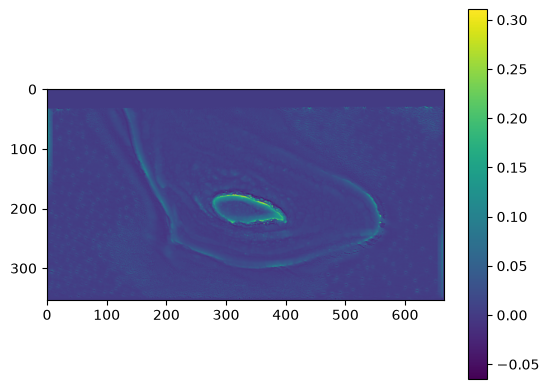

In [19]:
plt.imshow(mean_max_gamma)
plt.colorbar()

### PIPELINE ENCAPSULATION ROUTINE: STEPS 3 TO 12

In [20]:
def run_sa_mmt_segmentation(O_channel, target_mode):
    footprint = np.ones((5, 5), dtype=bool)
    
    # ---------------------------------------------------------------------
    # Step 3: Select target channel and local extrema type
    # ---------------------------------------------------------------------
    if target_mode == "high":
        local_max = maximum_filter(Z_grid, footprint=footprint, mode='constant', cval=np.nan)
        extrema = (Z_grid == local_max) & ~np.isnan(Z_grid)
    else:
        local_min = minimum_filter(Z_grid, footprint=footprint, mode='constant', cval=np.nan)
        extrema = (Z_grid == local_min) & ~np.isnan(Z_grid)
        
    # ---------------------------------------------------------------------
    # Steps 4 & 5: Calculate openness statistics and dual thresholds
    # ---------------------------------------------------------------------
    O_valid = O_channel[np.isfinite(O_channel)]
    mu = float(np.mean(O_valid))
    sigma = float(np.std(O_valid))
    T_large = mu - (C_LARGE * sigma)
    T_small = mu - (C_SMALL * sigma)
    
    # ---------------------------------------------------------------------
    # Step 6: Create two binary masks
    # ---------------------------------------------------------------------
    M_large = (O_channel < T_large) & ~np.isnan(O_channel)
    M_small = (O_channel < T_small) & ~np.isnan(O_channel)
    
    # ---------------------------------------------------------------------
    # Step 7: Determine strict and loose masks
    # ---------------------------------------------------------------------
    if np.sum(M_large) <= np.sum(M_small):
        M_strict, M_loose = M_large, M_small
    else:
        M_strict, M_loose = M_small, M_large
        
    # ---------------------------------------------------------------------
    # Step 8: Polygonise both masks
    # ---------------------------------------------------------------------
    def polygonise(mask):
        polygons = []
        for geojson_shape, _ in features.shapes(mask.astype(np.uint8), mask=mask, transform=tif_profile['transform']):
            geom = shape(geojson_shape)
            if not geom.is_valid: geom = geom.buffer(0)
            polygons.append(geom)
        return polygons

    P_strict_raw = polygonise(M_strict)
    P_loose_raw = polygonise(M_loose)
    
    # ---------------------------------------------------------------------
    # Step 9: Keep only polygons containing local extrema
    # ---------------------------------------------------------------------
    extrema_rows, extrema_cols = np.where(extrema)
    extrema_points = [shape({'type': 'Point', 'coordinates': tif_profile['transform'] * (col + 0.5, row + 0.5)}) 
                      for row, col in zip(extrema_rows, extrema_cols)]
    if not extrema_points: return [], O_channel
    extrema_collection = unary_union(extrema_points)
    
    P_strict = [P for P in P_strict_raw if P.intersects(extrema_collection)]
    P_loose = [Q for Q in P_loose_raw if Q.intersects(extrema_collection)]
    
    # ---------------------------------------------------------------------
    # Step 10: Overlay split/merge logic
    # ---------------------------------------------------------------------
    P_raw = []
    for Q in P_loose:
        contained = []
        for P in P_strict:
            if Q.contains(P): contained.append(P)
            elif Q.intersects(P):
                if Q.intersection(P).area / P.area > 0.5: contained.append(P)
        if len(contained) > 1: P_raw.extend(contained)
        elif len(contained) == 1: P_raw.append(Q)
        
    # ---------------------------------------------------------------------
    # Step 11: Clean geometries and remove small features dynamically
    # ---------------------------------------------------------------------
    P_cleaned = [P.buffer(0) if not P.is_valid else P for P in P_raw]
    
    P_unique = []
    for geom in P_cleaned:
        if not any(geom.equals(u) for u in P_unique): P_unique.append(geom)
        
    # Calculate native area metric dynamically against transformed downsampled parameters
    dynamic_area_threshold = TARGET_MIN_PIXELS * (cell_size ** 2)
    P_final = [P for P in P_unique if P.area >= dynamic_area_threshold]
    
    # ---------------------------------------------------------------------
    # Step 12: Return outputs
    # ---------------------------------------------------------------------
    return P_final, O_channel

### Print pipeline outputs

In [21]:
print(f"Processing Steps 3-12 for OS High Features (NO Channel)...")
high_features, NO_out = run_sa_mmt_segmentation(NO_grid, target_mode="high")

print(f"Processing Steps 3-12 for OS Low Features (PO Channel)...")
low_features, PO_out = run_sa_mmt_segmentation(PO_grid, target_mode="low")

print("\n" + "="*60)
print("GA-SAMMT PIPELINE RUN EXECUTED SUCCESSFULLY")
print("="*60)
print(f"Target Processed Layer Footprint: {Path(TARGET_BATHY_PATH).name}")
print(f"Total Computation Runtime:        {time.time() - global_start_time:.2f}s")
print(f"Final Mapped Highs (Shelf Banks): {len(high_features)} Polygons")
print(f"Final Mapped Lows (Flank Canyons): {len(low_features)} Polygons")
print("="*60)

Processing Steps 3-12 for OS High Features (NO Channel)...
Processing Steps 3-12 for OS Low Features (PO Channel)...

GA-SAMMT PIPELINE RUN EXECUTED SUCCESSFULLY
Target Processed Layer Footprint: os_bathy.tif
Total Computation Runtime:        28.35s
Final Mapped Highs (Shelf Banks): 62 Polygons
Final Mapped Lows (Flank Canyons): 80 Polygons


### Visualize the result as an image

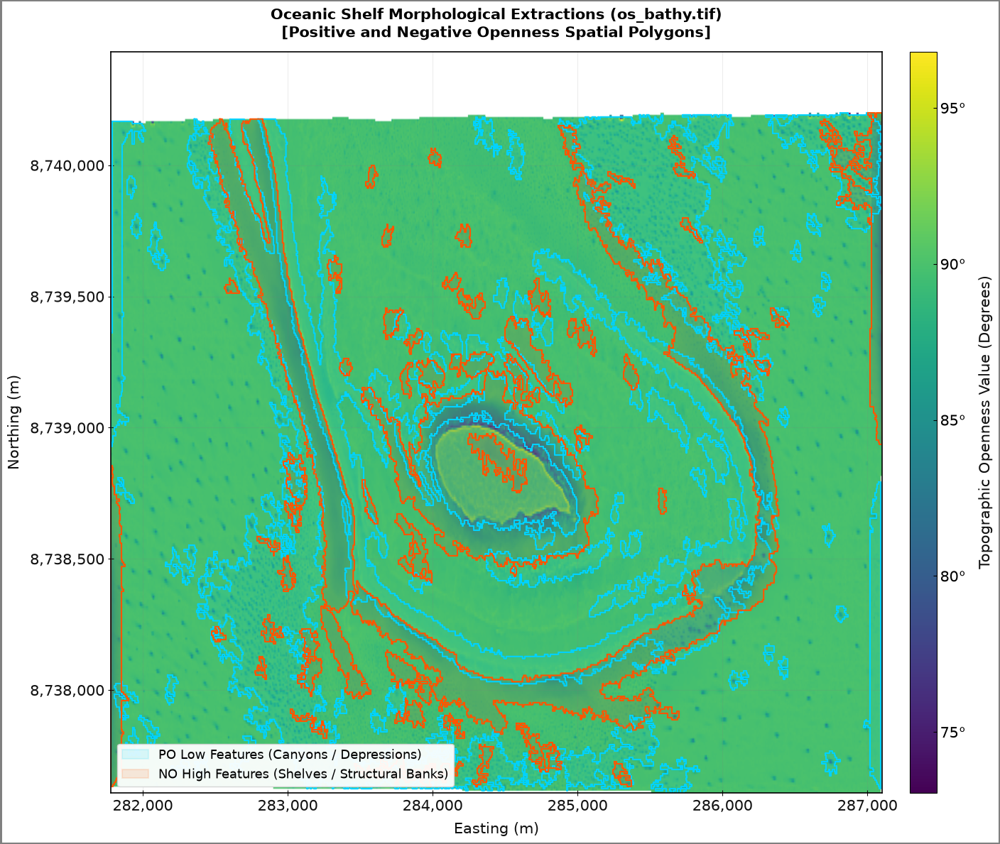

In [22]:
fig, ax = plt.subplots(figsize=(15, 12), edgecolor='gray', linewidth=2.5)

transform = tif_profile['transform']
x_min, y_max = transform * (0, 0)
x_max, y_min = transform * (cols, rows)
spatial_extent = [x_min, x_max, y_min, y_max]

# Render base continuous Viridis matrix backdrop using the active NO Channel array
im_viridis = ax.imshow(NO_out, cmap='viridis', extent=spatial_extent, aspect='auto')

# Contrasting, colorblind-accessible vector layout colors
po_color = '#00d2ff'  # Electric Cyan for PO Low Features (Canyons)
no_color = '#ff5500'  # Safety Orange for NO High Features (Banks/Shelves)

# Trace and fill final validated bathymetric low structures
for poly in low_features:
    geoms = poly.geoms if isinstance(poly, MultiPolygon) else [poly]
    for geom in geoms:
        x, y = geom.exterior.xy
        ax.plot(x, y, color=po_color, linewidth=1.5, alpha=1.0, label='_nolegend_')
        ax.fill(x, y, color=po_color, alpha=0.12, label='_nolegend_')
        
# Trace and fill final validated bathymetric high structures
for poly in high_features:
    geoms = poly.geoms if isinstance(poly, MultiPolygon) else [poly]
    for geom in geoms:
        x, y = geom.exterior.xy
        ax.plot(x, y, color=no_color, linewidth=1.5, alpha=1.0, label='_nolegend_')
        ax.fill(x, y, color=no_color, alpha=0.12, label='_nolegend_')

# Adjust layout boundaries to clip precisely around the target GeoTIFF coordinate window
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Force axis coordinates to render using standard thousand-separator comma notation
ax.get_xaxis().set_major_formatter(mticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax.get_yaxis().set_major_formatter(mticker.FuncFormatter(lambda y, p: format(int(y), ',')))

ax.set_xlabel("Easting (m)", fontsize=15, labelpad=8, color="#111111")
ax.set_ylabel("Northing (m)", fontsize=15, labelpad=8, color="#111111")
ax.tick_params(colors="#111111", labelsize=15, direction='inout', length=6)

ax.grid(True, linestyle="-", alpha=0.15, color="gray", zorder=0)

# Build crisp interior bounding spines to frame the image grid cleanly
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.2)

# Professional Map Topology Legend
po_patch = mpatches.Patch(facecolor=po_color, alpha=0.12, edgecolor=po_color, linewidth=1.5, label='PO Low Features (Canyons / Depressions)')
no_patch = mpatches.Patch(facecolor=no_color, alpha=0.12, edgecolor=no_color, linewidth=1.5, label='NO High Features (Shelves / Structural Banks)')
ax.legend(handles=[po_patch, no_patch], loc='lower left', framealpha=0.95, edgecolor='lightgray', fontsize=13)

# Configure symmetrical vertical color bar using degree ticks
cbar = fig.colorbar(im_viridis, ax=ax, orientation="vertical", pad=0.03, shrink=1.0, aspect=28)
cbar.set_label("Topographic Openness Value (Degrees)", fontsize=15, labelpad=12, color="#111111")
cbar.ax.tick_params(labelsize=15, direction='in')

def degree_formatter(x, pos):
    return f"{x:.0f}°"
cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(degree_formatter))

plt.title(f"Oceanic Shelf Morphological Extractions ({Path(TARGET_BATHY_PATH).name})\n[Positive and Negative Openness Spatial Polygons]", 
          fontsize=15, pad=15, weight="bold")
plt.tight_layout()



# Save output layout image to file
output_map_name = "../data/os_openness_polygons_map.png"
plt.savefig(output_map_name, bbox_inches='tight', dpi=300)
plt.show()

### Save the output as a geopackage file raster and vector

In [23]:
# Explicitly defining your local projected coordinate reference system
raster_crs = 'EPSG:32757'  # UTM Zone 57S

# --- A. Export Vectors to GeoPackage (.gpkg) ---
gpkg_output_path = "../data/os_openness_analysis.gpkg"

# Convert list of Shapely geometries directly to structured GeoDataFrames using your CRS
gdf_low = gpd.GeoDataFrame(geometry=low_features, crs=raster_crs)
gdf_high = gpd.GeoDataFrame(geometry=high_features, crs=raster_crs)

# Save vector sets as separate named feature layers inside one GeoPackage database
gdf_low.to_file(gpkg_output_path, layer="PO_Low_Features_Canyons", driver="GPKG")
gdf_high.to_file(gpkg_output_path, layer="NO_High_Features_Plateaus", driver="GPKG")
print(f"-> Successfully saved GIS Vector Layers to: {gpkg_output_path}")

# --- B. Export Real Data Raster to GeoTIFF (.tif) ---
raster_output_path = "../data/os_negative_openness_raster.tif"

# Clone and override structural parameters, strictly overwriting the CRS
raster_profile = tif_profile.copy()
raster_profile.update({
    'driver': 'GTiff',
    'height': NO_out.shape[0],
    'width': NO_out.shape[1],
    'dtype': str(NO_out.dtype),
    'count': 1,
    'crs': raster_crs  # Hardcodes the projection directly into the GeoTIFF headers
})

# Commit the 2D floating-point grid matrix to geographical disk file
with rasterio.open(raster_output_path, "w", **raster_profile) as dst:
    dst.write(NO_out, 1)
print(f"-> Successfully saved GIS Raster Core to: {raster_output_path}")
print("All exports completed safely.")

-> Successfully saved GIS Vector Layers to: ../data/os_openness_analysis.gpkg
-> Successfully saved GIS Raster Core to: ../data/os_negative_openness_raster.tif
All exports completed safely.


### Visualize the geopackage output in a map view

In [26]:
# 1. Load the layer paths from your GeoPackage
gpkg_path = "../data/os_openness_analysis.gpkg"

gdf_canyons = gpd.read_file(gpkg_path, layer="PO_Low_Features_Canyons")
gdf_plateaus = gpd.read_file(gpkg_path, layer="NO_High_Features_Plateaus")

# 2. Plot the first layer interactively
# We use color mapping and a baseline background map (like OpenStreetMap)
m = gdf_canyons.explore(color="#00d2ff", name="Canyons (PO Low)", tiles="CartoDB positron")

# 3. Layer the second dataset on top of the same map canvas
gdf_plateaus.explore(m=m, color="#ff5500", name="Plateaus (NO High)")

# Display the map view frame
m

## PC Bathymetric TIF

#### Set the File Path

In [27]:
TARGET_BATHY_PATH = "../data/pc_bathy.tif"

We start by setting out the [radius cells](#circle-radius) for Point Cloates Shelf (PC).

In [28]:
RADIUS_CELLS = 10         # Lookup horizon matrix index (tight sweep for local features)
C_LARGE = -0.15           # Coarse scale offset parameter
C_SMALL = 0.0             # Fine scale baseline constraint

# Explicitly define minimum feature footprint size in actual PIXELS to prevent noise
TARGET_MIN_PIXELS = 45    # Filters out any polygon spanning less than 45 total raster cells

# PERFORMANCE TUNING: Downsampling factor (1 = raw data, 2 = half resolution, 4 = quarter resolution)
# Increasing this to 2 or 4 scales down the processing time exponentially (quadratically)
DOWNSAMPLE_FACTOR = 4

### STEP 1: LOAD RASTER & INITIALIZE SPATIAL METADATA

In [29]:
with rasterio.open(str(TARGET_BATHY_PATH)) as src:
    tif_profile = src.meta.copy()
    
    if DOWNSAMPLE_FACTOR > 1:
        # Calculate downsampled grid dimensions
        new_height = int(src.height / DOWNSAMPLE_FACTOR)
        new_width = int(src.width / DOWNSAMPLE_FACTOR)
        print(f"-> Performance Mode: Downsampling raster from ({src.height}x{src.width}) to ({new_height}x{new_width})")
        
        # Read and resample the data using bilinear interpolation
        B_raw = src.read(
            1,
            out_shape=(new_height, new_width),
            resampling=Resampling.bilinear
        )
        
        # Update transform and profile parameters to match the new grid spacing
        new_transform = src.transform * src.transform.scale(
            (src.width / B_raw.shape[1]),
            (src.height / B_raw.shape[0])
        )
        tif_profile.update({
            'height': new_height,
            'width': new_width,
            'transform': new_transform
        })
    else:
        B_raw = src.read(1)
        
    cell_size = tif_profile['transform'][0]
    nodata_val = src.nodatavals[0]
    
    # Isolate valid cells from source raster boundaries
    Z_grid = np.where(B_raw == nodata_val, np.nan, B_raw.astype(float)) if nodata_val is not None else B_raw.astype(float)

# Enforce standard elevation-positive-up convention across calculation arrays
Z_grid = -Z_grid  

compass_definitions = {
    "N":  (-1,  0), "NE": (-1,  1), "E":  ( 0,  1), "SE": ( 1,  1),
    "S":  ( 1,  0), "SW": ( 1, -1), "W":  ( 0, -1), "NW": (-1, -1)
}

geometry_meta = {}
for direction, (dr, dc) in compass_definitions.items():
    steps = np.arange(1, RADIUS_CELLS + 1)
    row_offsets = dr * steps
    col_offsets = dc * steps
    step_multiplier = np.sqrt(dr**2 + dc**2)
    distances = steps * cell_size * step_multiplier
    
    geometry_meta[direction] = {
        "row_offsets": row_offsets, "col_offsets": col_offsets, "distances": distances
    }

-> Performance Mode: Downsampling raster from (1972x1971) to (493x492)


### STEP 2: DUAL-CHANNEL VECTORIZED RAY CASTING ENGINE (0°-180° SCALE)

#### Calculating PO and NO matrices concurrently across 8 directions

In [30]:
global_start_time = time.time()
rows, cols = Z_grid.shape

# Pre-allocate global accumulation arrays to save massive memory reallocations
mean_max_gamma = np.zeros((rows, cols), dtype=float)
mean_min_gamma = np.zeros((rows, cols), dtype=float)

for direction, geom in geometry_meta.items():
    max_gamma_dir = np.full((rows, cols), -np.inf)
    min_gamma_dir = np.full((rows, cols), np.inf)
    
    for dr, dc, dist in zip(geom["row_offsets"], geom["col_offsets"], geom["distances"]):
        Z_shifted = np.roll(Z_grid, shift=(-dr, -dc), axis=(0, 1))
        
        # High-speed in-place edge masking (saves up to 60% system overhead)
        if dr > 0: Z_shifted[:dr, :] = np.nan
        if dr < 0: Z_shifted[dr:, :] = np.nan
        if dc > 0: Z_shifted[:, :dc] = np.nan
        if dc < 0: Z_shifted[:, dc:] = np.nan
        
        gamma = np.arctan((Z_shifted - Z_grid) / dist)
        
        # Sift structural constraints inline
        with np.errstate(all='ignore'):
            max_gamma_dir = np.fmax(max_gamma_dir, gamma)
            min_gamma_dir = np.fmin(min_gamma_dir, gamma)
            
    # Purge remaining floating infinities from edge boundaries
    max_gamma_dir[~np.isfinite(max_gamma_dir)] = 0.0
    min_gamma_dir[~np.isfinite(min_gamma_dir)] = 0.0
    
    # Standardize weighting across the 8 tracking directions
    mean_max_gamma += max_gamma_dir / 8.0
    mean_min_gamma += min_gamma_dir / 8.0

# Implement traditional Yokoyama 0 to 180-degree mathematical conversion bounds
PO_grid = np.degrees((np.pi / 2.0) - mean_max_gamma)
NO_grid = np.degrees((np.pi / 2.0) + mean_min_gamma)

nan_mask = np.isnan(Z_grid)
PO_grid[nan_mask], NO_grid[nan_mask] = np.nan, np.nan

### PIPELINE ENCAPSULATION ROUTINE: STEPS 3 TO 12

In [31]:
def run_sa_mmt_segmentation(O_channel, target_mode):
    footprint = np.ones((5, 5), dtype=bool)
    
    # ---------------------------------------------------------------------
    # Step 3: Select target channel and local extrema type
    # ---------------------------------------------------------------------
    if target_mode == "high":
        local_max = maximum_filter(Z_grid, footprint=footprint, mode='constant', cval=np.nan)
        extrema = (Z_grid == local_max) & ~np.isnan(Z_grid)
    else:
        local_min = minimum_filter(Z_grid, footprint=footprint, mode='constant', cval=np.nan)
        extrema = (Z_grid == local_min) & ~np.isnan(Z_grid)
        
    # ---------------------------------------------------------------------
    # Steps 4 & 5: Calculate openness statistics and dual thresholds
    # ---------------------------------------------------------------------
    O_valid = O_channel[np.isfinite(O_channel)]
    mu = float(np.mean(O_valid))
    sigma = float(np.std(O_valid))
    T_large = mu - (C_LARGE * sigma)
    T_small = mu - (C_SMALL * sigma)
    
    # ---------------------------------------------------------------------
    # Step 6: Create two binary masks
    # ---------------------------------------------------------------------
    M_large = (O_channel < T_large) & ~np.isnan(O_channel)
    M_small = (O_channel < T_small) & ~np.isnan(O_channel)
    
    # ---------------------------------------------------------------------
    # Step 7: Determine strict and loose masks
    # ---------------------------------------------------------------------
    if np.sum(M_large) <= np.sum(M_small):
        M_strict, M_loose = M_large, M_small
    else:
        M_strict, M_loose = M_small, M_large
        
    # ---------------------------------------------------------------------
    # Step 8: Polygonise both masks
    # ---------------------------------------------------------------------
    def polygonise(mask):
        polygons = []
        for geojson_shape, _ in features.shapes(mask.astype(np.uint8), mask=mask, transform=tif_profile['transform']):
            geom = shape(geojson_shape)
            if not geom.is_valid: geom = geom.buffer(0)
            polygons.append(geom)
        return polygons

    P_strict_raw = polygonise(M_strict)
    P_loose_raw = polygonise(M_loose)
    
    # ---------------------------------------------------------------------
    # Step 9: Keep only polygons containing local extrema
    # ---------------------------------------------------------------------
    extrema_rows, extrema_cols = np.where(extrema)
    extrema_points = [shape({'type': 'Point', 'coordinates': tif_profile['transform'] * (col + 0.5, row + 0.5)}) 
                      for row, col in zip(extrema_rows, extrema_cols)]
    if not extrema_points: return [], O_channel
    extrema_collection = unary_union(extrema_points)
    
    P_strict = [P for P in P_strict_raw if P.intersects(extrema_collection)]
    P_loose = [Q for Q in P_loose_raw if Q.intersects(extrema_collection)]
    
    # ---------------------------------------------------------------------
    # Step 10: Overlay split/merge logic
    # ---------------------------------------------------------------------
    P_raw = []
    for Q in P_loose:
        contained = []
        for P in P_strict:
            if Q.contains(P): contained.append(P)
            elif Q.intersects(P):
                if Q.intersection(P).area / P.area > 0.5: contained.append(P)
        if len(contained) > 1: P_raw.extend(contained)
        elif len(contained) == 1: P_raw.append(Q)
        
    # ---------------------------------------------------------------------
    # Step 11: Clean geometries and remove small features dynamically
    # ---------------------------------------------------------------------
    P_cleaned = [P.buffer(0) if not P.is_valid else P for P in P_raw]
    
    P_unique = []
    for geom in P_cleaned:
        if not any(geom.equals(u) for u in P_unique): P_unique.append(geom)
        
    # Calculate native coordinate area unit threshold based on real cell dimensions (Meters^2)
    dynamic_area_threshold = TARGET_MIN_PIXELS * (cell_size ** 2)
    P_final = [P for P in P_unique if P.area >= dynamic_area_threshold]
    
    # ---------------------------------------------------------------------
    # Step 12: Return outputs
    # ---------------------------------------------------------------------
    return P_final, O_channel

### Print pipeline outputs

In [32]:
print(f"Processing Steps 3-12 for PC High Features (NO Channel)...")
high_features, NO_out = run_sa_mmt_segmentation(NO_grid, target_mode="high")

print(f"Processing Steps 3-12 for PC Low Features (PO Channel)...")
low_features, PO_out = run_sa_mmt_segmentation(PO_grid, target_mode="low")

print("\n" + "="*60)
print("GA-SAMMT PIPELINE RUN EXECUTED SUCCESSFULLY")
print("="*60)
print(f"Target Processed Layer Footprint: {Path(TARGET_BATHY_PATH).name}")
print(f"Total Computation Runtime:        {time.time() - global_start_time:.2f}s")
print(f"Final Mapped Highs (PC Targets):  {len(high_features)} Polygons")
print(f"Final Mapped Lows (PC Canyons):   {len(low_features)} Polygons")
print("="*60)

Processing Steps 3-12 for PC High Features (NO Channel)...
Processing Steps 3-12 for PC Low Features (PO Channel)...

GA-SAMMT PIPELINE RUN EXECUTED SUCCESSFULLY
Target Processed Layer Footprint: pc_bathy.tif
Total Computation Runtime:        15.46s
Final Mapped Highs (PC Targets):  44 Polygons
Final Mapped Lows (PC Canyons):   108 Polygons


### Visualize the result as an image

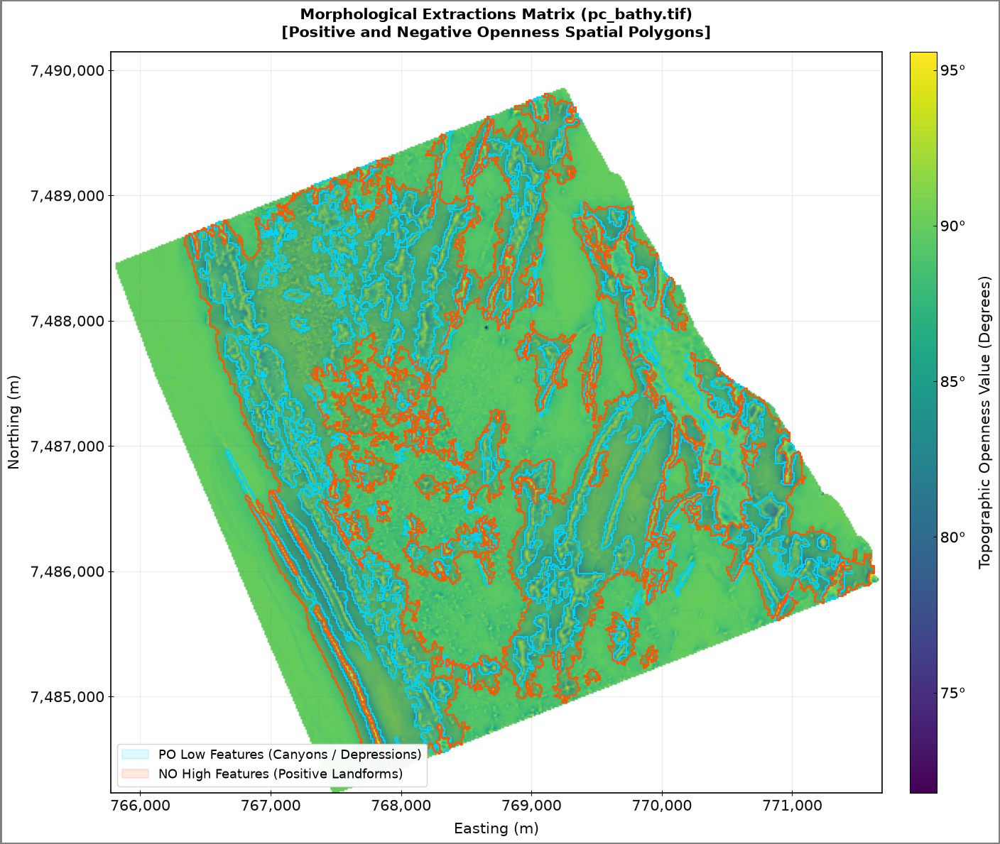

In [33]:
fig, ax = plt.subplots(figsize=(15, 12), edgecolor='gray', linewidth=2.5)

transform = tif_profile['transform']
x_min, y_max = transform * (0, 0)
x_max, y_min = transform * (cols, rows)
spatial_extent = [x_min, x_max, y_min, y_max]

# Render base continuous Viridis matrix backdrop using the active NO Channel array
im_viridis = ax.imshow(NO_out, cmap='viridis', extent=spatial_extent, aspect='auto')

# Contrasting, colorblind-accessible vector layout colors
po_color = '#00d2ff'  # Electric Cyan for PO Low Features
no_color = '#ff5500'  # Safety Orange for NO High Features

# Trace and fill final validated bathymetric low structures
for poly in low_features:
    geoms = poly.geoms if isinstance(poly, MultiPolygon) else [poly]
    for geom in geoms:
        x, y = geom.exterior.xy
        ax.plot(x, y, color=po_color, linewidth=1.5, alpha=1.0, label='_nolegend_')
        ax.fill(x, y, color=po_color, alpha=0.12, label='_nolegend_')
        
# Trace and fill final validated bathymetric high structures
for poly in high_features:
    geoms = poly.geoms if isinstance(poly, MultiPolygon) else [poly]
    for geom in geoms:
        x, y = geom.exterior.xy
        ax.plot(x, y, color=no_color, linewidth=1.5, alpha=1.0, label='_nolegend_')
        ax.fill(x, y, color=no_color, alpha=0.12, label='_nolegend_')

# Adjust layout boundaries to clip precisely around the target GeoTIFF coordinate window
ax.set_xlim(x_min, x_max)
ax.set_ylim(y_min, y_max)

# Force axis coordinates to render using standard thousand-separator comma notation
ax.get_xaxis().set_major_formatter(mticker.FuncFormatter(lambda x, p: format(int(x), ',')))
ax.get_yaxis().set_major_formatter(mticker.FuncFormatter(lambda y, p: format(int(y), ',')))

ax.set_xlabel("Easting (m)", fontsize=15, labelpad=8, color="#111111")
ax.set_ylabel("Northing (m)", fontsize=15, labelpad=8, color="#111111")
ax.tick_params(colors="#111111", labelsize=15, direction='inout', length=6)

ax.grid(True, linestyle="-", alpha=0.15, color="gray", zorder=0)

# Build crisp interior bounding spines to frame the image grid cleanly
for spine in ax.spines.values():
    spine.set_edgecolor('black')
    spine.set_linewidth(1.2)

# Professional Map Topology Legend
po_patch = mpatches.Patch(facecolor=po_color, alpha=0.12, edgecolor=po_color, linewidth=1.5, label='PO Low Features (Canyons / Depressions)')
no_patch = mpatches.Patch(facecolor=no_color, alpha=0.12, edgecolor=no_color, linewidth=1.5, label='NO High Features (Positive Landforms)')
ax.legend(handles=[po_patch, no_patch], loc='lower left', framealpha=0.95, edgecolor='lightgray', fontsize=13)

# Configure symmetrical vertical color bar using degree ticks
cbar = fig.colorbar(im_viridis, ax=ax, orientation="vertical", pad=0.03, shrink=1.0, aspect=28)
cbar.set_label("Topographic Openness Value (Degrees)", fontsize=15, labelpad=12, color="#111111")
cbar.ax.tick_params(labelsize=15, direction='in')

def degree_formatter(x, pos):
    return f"{x:.0f}°"
cbar.ax.yaxis.set_major_formatter(mticker.FuncFormatter(degree_formatter))

plt.title(f"Morphological Extractions Matrix ({Path(TARGET_BATHY_PATH).name})\n[Positive and Negative Openness Spatial Polygons]", 
          fontsize=15, pad=15, weight="bold")
plt.tight_layout()

# Save output layout image to file
output_map_name = "../data/pc_openness_polygons_map.png"
plt.savefig(output_map_name, bbox_inches='tight', dpi=300)
plt.show()

### Save the output as a geopackage file raster and vector

In [34]:
# Explicitly defining your local projected coordinate reference system
raster_crs = 'EPSG:32757'  # UTM Zone 57S

# --- A. Export Vectors to GeoPackage (.gpkg) ---
gpkg_output_path = "../data/pc_openness_analysis.gpkg"

# Convert list of Shapely geometries directly to structured GeoDataFrames using your CRS
gdf_low = gpd.GeoDataFrame(geometry=low_features, crs=raster_crs)
gdf_high = gpd.GeoDataFrame(geometry=high_features, crs=raster_crs)

# Save vector sets as separate named feature layers inside one GeoPackage database
gdf_low.to_file(gpkg_output_path, layer="PO_Low_Features_Canyons", driver="GPKG")
gdf_high.to_file(gpkg_output_path, layer="NO_High_Features_Plateaus", driver="GPKG")
print(f"-> Successfully saved GIS Vector Layers to: {gpkg_output_path}")

# --- B. Export Real Data Raster to GeoTIFF (.tif) ---
raster_output_path = "../data/os_negative_openness_raster.tif"

# Clone and override structural parameters, strictly overwriting the CRS
raster_profile = tif_profile.copy()
raster_profile.update({
    'driver': 'GTiff',
    'height': NO_out.shape[0],
    'width': NO_out.shape[1],
    'dtype': str(NO_out.dtype),
    'count': 1,
    'crs': raster_crs  # Hardcodes the projection directly into the GeoTIFF headers
})

# Commit the 2D floating-point grid matrix to geographical disk file
with rasterio.open(raster_output_path, "w", **raster_profile) as dst:
    dst.write(NO_out, 1)
print(f"-> Successfully saved GIS Raster Core to: {raster_output_path}")
print("All exports completed safely.")

-> Successfully saved GIS Vector Layers to: ../data/pc_openness_analysis.gpkg
-> Successfully saved GIS Raster Core to: ../data/os_negative_openness_raster.tif
All exports completed safely.


### Visualize the geopackage output in a map view

In [35]:
# 1. Load the layer paths from your GeoPackage
gpkg_path = "../data/pc_openness_analysis.gpkg"

gdf_canyons = gpd.read_file(gpkg_path, layer="PO_Low_Features_Canyons")
gdf_plateaus = gpd.read_file(gpkg_path, layer="NO_High_Features_Plateaus")

# 2. Plot the first layer interactively
# We use color mapping and a baseline background map (like OpenStreetMap)
m = gdf_canyons.explore(color="#00d2ff", name="Canyons (PO Low)", tiles="CartoDB positron")

# 3. Layer the second dataset on top of the same map canvas
gdf_plateaus.explore(m=m, color="#ff5500", name="Plateaus (NO High)")

# Display the map view frame
m